# Data preprocessing and augmentation using TorchIO: a tutorial


Preprocessing and augmentation are always overlooked in papers, but these are extremely important and therefore the software and parameters used should be correctly reported. Most importantly, papers will be more easily reproducible if researchers can share the tools they use for these tasks.

![One does not simply throw data into a U-Net](https://i.imgflip.com/4b1gac.jpg)

Transforms are callable Python objects that take data and modify it. In the context of deep learning for medical images, they can be used to pre- or post-process the images, or for data augmentation.

[TorchIO](https://torchio.readthedocs.io/index.html) transforms support 4D tensors (and therefore also 2D and 3D), so it can be used to process most types of medical images: X-rays, CT, 4D ultrasound, structural MRI, diffusion MRI, functional MRI, PET, SPECT, multispectral, RGB, histology...

In this tutorial, we will go through most of the transforms and show some usage examples, including a typical composition of transforms for training and testing.

Some important concepts of medical imaging are also explained, so it will be helpful for students, researchers or clinicians who are getting started in the field.

## Setup

We will first [install TorchIO](https://torchio.readthedocs.io/quickstart.html#installation) and other libraries, download a couple of files and import the necessary modules.

In [1]:
!pip install torchio==0.17.25 --quiet
!pip install pandas --quiet
!pip install matplotlib --quiet
!pip install seaborn --quiet
!pip install scikit-image --quiet
!pip install Pillow --quiet
!curl -s -o colormap.txt https://raw.githubusercontent.com/thenineteen/Semiology-Visualisation-Tool/master/slicer/Resources/Color/BrainAnatomyLabelsV3_0.txt
!curl -s -o slice_7t.jpg https://static.healthcare.siemens.com/siemens_hwem-hwem_ssxa_websites-context-root/wcm/idc/groups/public/@global/@imaging/@mri/documents/image/mda5/nje2/~edisp/siemens-healthineers_mri_magnetom-terra_3-07093947/~renditions/siemens-healthineers_mri_magnetom-terra_3-07093947~8.jpg
!curl -s -o slice_histo.jpg https://bcf.technion.ac.il/wp-content/uploads/2018/05/Neta-histology-slice-626.jpg

import copy

import torch
import torchio as tio

import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
%config InlineBackend.figure_format = 'retina'

     |████████████████████████████████| 112kB 3.2MB/s 
     |████████████████████████████████| 42.5MB 98kB/s 
If you use TorchIO for your research, please cite the following paper:
Pérez-García et al., TorchIO: a Python library for efficient loading,
preprocessing, augmentation and patch-based sampling of medical images
in deep learning. Link: https://arxiv.org/abs/2003.04696



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Below are some visualization functions. The cell is hidden by default on Google Colab, but you can expand it by double-clicking on it.

In [2]:
#@title Visualization functions (double-click to expand)
def get_bounds(self):
    """Get image bounds in mm.

    Returns:
        np.ndarray: [description]
    """
    first_index = 3 * (-0.5,)
    last_index = np.array(self.spatial_shape) - 0.5
    first_point = nib.affines.apply_affine(self.affine, first_index)
    last_point = nib.affines.apply_affine(self.affine, last_index)
    array = np.array((first_point, last_point))
    bounds_x, bounds_y, bounds_z = array.T.tolist()
    return bounds_x, bounds_y, bounds_z

def to_pil(image):
    from PIL import Image
    data = image.numpy().squeeze().T
    data = data.astype(np.uint8)
    image = Image.fromarray(data)
    w, h = image.size
    return image

def stretch(img):
    p1, p99 = np.percentile(img, (1, 99))
    from skimage import exposure
    img_rescale = exposure.rescale_intensity(img, in_range=(p1, p99))
    return img_rescale

def show_fpg(subject, to_ras=False, stretch_slices=True, indices=None):
    subject = tio.ToCanonical()(subject) if to_ras else subject
    def flip(x):
        return np.rot90(x)
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    if indices is None:
        half_shape = torch.Tensor(subject.spatial_shape) // 2
        i, j, k = half_shape.long()
        i -= 5  # use a better slice
    else:
        i, j, k = indices
    bounds_x, bounds_y, bounds_z = get_bounds(subject.t1)  ###

    orientation = ''.join(subject.t1.orientation)
    if orientation != 'RAS':
        import warnings
        warnings.warn(f'Image orientation should be RAS+, not {orientation}+')
    
    kwargs = dict(cmap='gray', interpolation='none')
    slices = subject.t1.data[0, i], subject.t1.data[0, :, j], subject.t1.data[0, ..., k]
    if stretch_slices:
        slices = [stretch(s.numpy()) for s in slices]
    sag, cor, axi = slices
    
    axes[0, 0].imshow(flip(sag), extent=bounds_y + bounds_z, **kwargs)
    axes[0, 1].imshow(flip(cor), extent=bounds_x + bounds_z, **kwargs)
    axes[0, 2].imshow(flip(axi), extent=bounds_x + bounds_y, **kwargs)

    kwargs = dict(interpolation='none')
    slices = subject.seg.data[0, i], subject.seg.data[0, :, j], subject.seg.data[0, ..., k]
    sag, cor, axi = [color_table.colorize(s.long()) if s.max() > 1 else s for s in slices]
    axes[1, 0].imshow(flip(sag), extent=bounds_y + bounds_z, **kwargs)
    axes[1, 1].imshow(flip(cor), extent=bounds_x + bounds_z, **kwargs)
    axes[1, 2].imshow(flip(axi), extent=bounds_x + bounds_y, **kwargs)
    
    plt.tight_layout()


class ColorTable:
    def __init__(self, colors_path):
        self.df = self.read_color_table(colors_path)

    @staticmethod
    def read_color_table(colors_path):
        df = pd.read_csv(
            colors_path,
            sep=' ',
            header=None,
            names=['Label', 'Name', 'R', 'G', 'B', 'A'],
            index_col='Label',
        )
        return df

    def get_color(self, label: int):
        """
        There must be nicer ways of doing this
        """
        try:
            rgb = (
                self.df.loc[label].R,
                self.df.loc[label].G,
                self.df.loc[label].B,
            )
        except KeyError:
            rgb = 0, 0, 0
        return rgb

    def colorize(self, label_map: np.ndarray) -> np.ndarray:
        rgb = np.stack(3 * [label_map], axis=-1)
        for label in np.unique(label_map):
            mask = label_map == label
            color = self.get_color(label)
            rgb[mask] = color
        return rgb

color_table = ColorTable('colormap.txt')

## Input types

In TorchIO, [transforms](https://torchio.readthedocs.io/transforms/transforms.html) input can be multiple things:
1. TorchIO `Subject`
2. TorchIO `Image`
3. 4D NumPy array
4. 4D PyTorch tensor
5. SimpleITK image

Let's try first a tiny 4D tensor.

In [3]:
add_noise = tio.RandomNoise()
tensor = torch.ones(1, 2, 2, 2)
transformed = add_noise(tensor)

print('Before transform:')
print(tensor)
print()
print('After transform:')
print(transformed)

Before transform:
tensor([[[[1., 1.],
          [1., 1.]],

         [[1., 1.],
          [1., 1.]]]])

After transform:
tensor([[[[1.0174, 0.9953],
          [1.0120, 1.0015]],

         [[0.9951, 0.9968],
          [0.9818, 0.9814]]]])


We can create a [`torchio.ScalarImage`]() from it, and the result will be of the same type.

In [4]:
image = tio.ScalarImage(tensor=tensor)
transformed = add_noise(image)
print(transformed)

ScalarImage(shape: (1, 2, 2, 2); spacing: (1.00, 1.00, 1.00); orientation: RAS+; memory: 32 Bytes; type: intensity)


Let's try with [`torchio.Subject`]().

In [5]:
subject = tio.Subject(tiny=image)
transformed = add_noise(subject)
print(transformed)

Subject(Keys: ('tiny',); images: 1)


And finally, a SimpleITK image:

In [6]:
sitk_image = image.as_sitk()
transformed = add_noise(sitk_image)
print(type(transformed))

<class 'SimpleITK.SimpleITK.Image'>


## Spatial transforms

Spatial transforms modify the image bounds or the voxel positions. They are applied to all images simultaneously, as we will se below.

We will use for the tutorial a dataset that can be downloaded with [`torchio.datasets`](https://torchio.readthedocs.io/datasets.html). It contains a 3T structural MRI, a corresponding [brain parcellation](http://niftyweb.cs.ucl.ac.uk/program.php?p=GIF) and to transforms to the MNI space, one rigid (6 DOF: 3 for rotation and 3 for translation) and one affine (12 DOF: 3 for rotation, 3 for translation, 3 for scaling and 3 for shearing).

Sample subject: FPG(Keys: ('t1', 'seg'); images: 2)






/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: UserWarning: Image orientation should be RAS+, not PIR+


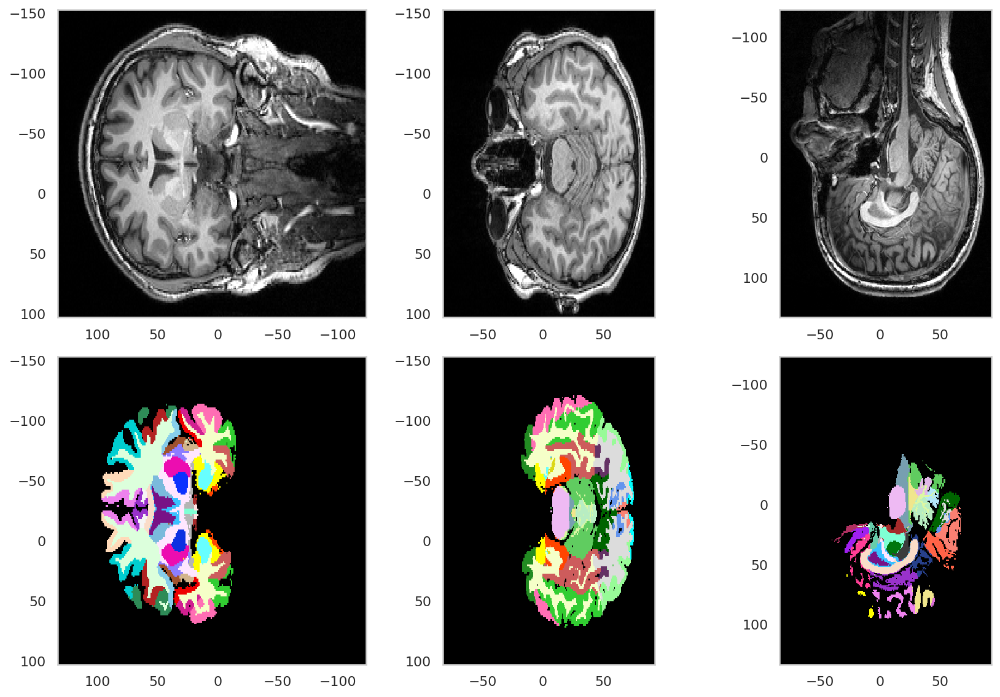

In [7]:
fpg = tio.datasets.FPG()
print('Sample subject:', fpg)
show_fpg(fpg)

The aspect ratio is distorted and it looks upside down. This is because our visualization function expects images in [`RAS+` orientation](https://nipy.org/nibabel/image_orientation.html), but this image is in `PIR+`. We can use a preprocessing transform to fix that.

### To canonical

[`ToCanonical`](https://torchio.readthedocs.io/transforms/preprocessing.html#tocanonical) reorganizes the voxels positions and the associated [affine matrix](https://nipy.org/nibabel/coordinate_systems.html#the-affine-matrix-as-a-transformation-between-spaces) so that the image is now in `RAS+` orientation, i.e. the voxels indices will grow from left to right, from posterior (back) to anterior (nose) and from inferior (feet) to superior (head), respectively.

Old orientation: ('P', 'I', 'R')
New orientation: ('R', 'A', 'S')


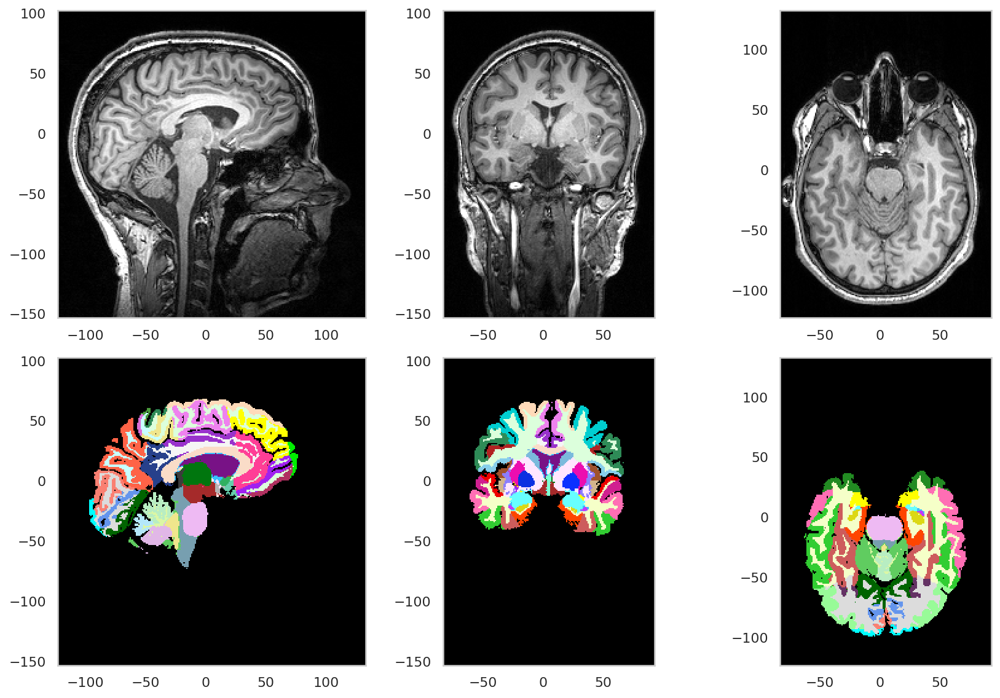

In [8]:
to_ras = tio.ToCanonical()
fpg_ras = to_ras(fpg)
print('Old orientation:', fpg.t1.orientation)
print('New orientation:', fpg_ras.t1.orientation)
show_fpg(fpg_ras)

As you can see, the same transform is applied to the scalar image and to the label map.

In [9]:
print(fpg_ras.t1)
print(fpg_ras.seg)

ScalarImage(shape: (1, 176, 256, 256); spacing: (1.00, 1.00, 1.00); orientation: RAS+; memory: 44.0 MiB; type: intensity)
LabelMap(shape: (1, 176, 256, 256); spacing: (1.00, 1.00, 1.00); orientation: RAS+; memory: 44.0 MiB; type: label)


### Resample

Images are discrete versions of continuous signals, therefore a spatial sampling frequency, and therefore also a period, are always associated with them. The spatial period is the distance between the voxel centers, or spacing. It is also the voxel size. We can check the image spacing (in mm) using the `spacing` property, or printing an image that has been loaded.

In [10]:
print(fpg_ras.t1)

ScalarImage(shape: (1, 176, 256, 256); spacing: (1.00, 1.00, 1.00); orientation: RAS+; memory: 44.0 MiB; type: intensity)


We might prefer to resize our images to reduce computational burden. For that, we need to *downsample* our image. We can down- or up-sample our images with the [`Resample` transform](https://torchio.readthedocs.io/transforms/preprocessing.html#resample).

We will use an image 3 times smaller than our original version. To keep the image bounds constant, the image spacing will be 3 times larger than the original one, i.e. 3 mm.

Original image: ScalarImage(shape: (1, 176, 256, 256); spacing: (1.00, 1.00, 1.00); orientation: RAS+; memory: 44.0 MiB; type: intensity)
Downsampled image: ScalarImage(shape: (1, 60, 86, 86); spacing: (3.00, 3.00, 3.00); orientation: RAS+; memory: 1.7 MiB; type: intensity)
The downsampled image takes 25 times less memory!


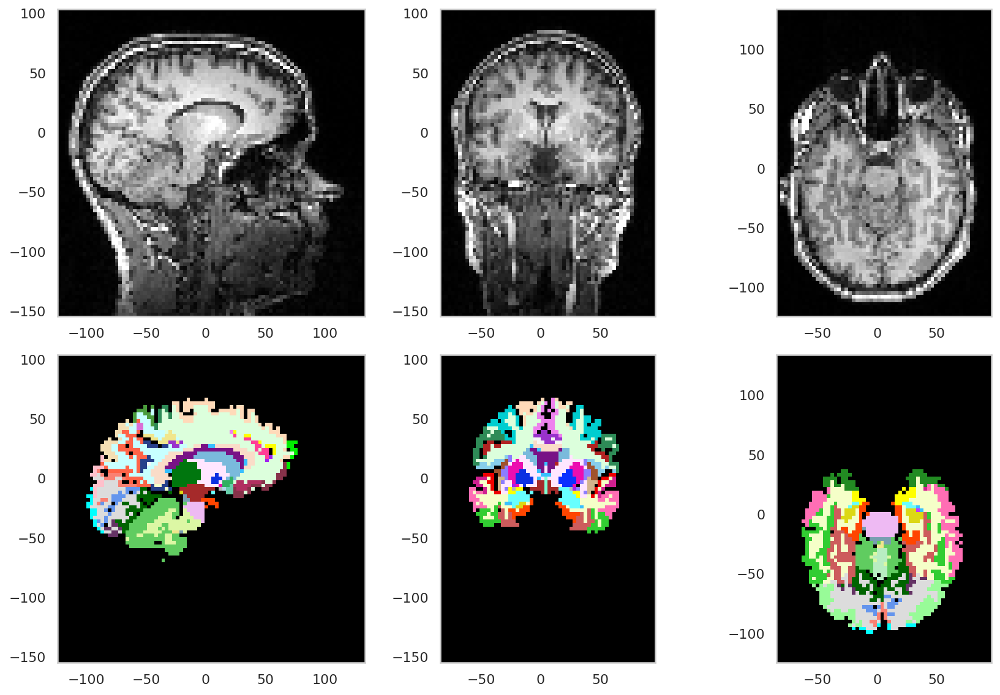

In [11]:
downsampling_factor = 3
original_spacing = 1
target_spacing = downsampling_factor / original_spacing  # in mm
downsample = tio.Resample(target_spacing)
downsampled = downsample(fpg_ras)
print('Original image:', fpg_ras.t1)
print('Downsampled image:', downsampled.t1)
print(f'The downsampled image takes {int(fpg_ras.t1.memory / downsampled.t1.memory)} times less memory!')
show_fpg(downsampled)

The downsampling generates some [aliasing](https://en.wikipedia.org/wiki/Aliasing). We can use concepts of digital signal processing to compute an optimal Gaussian kernel that we will convolve with the image to remove high frequencies before downsampling.

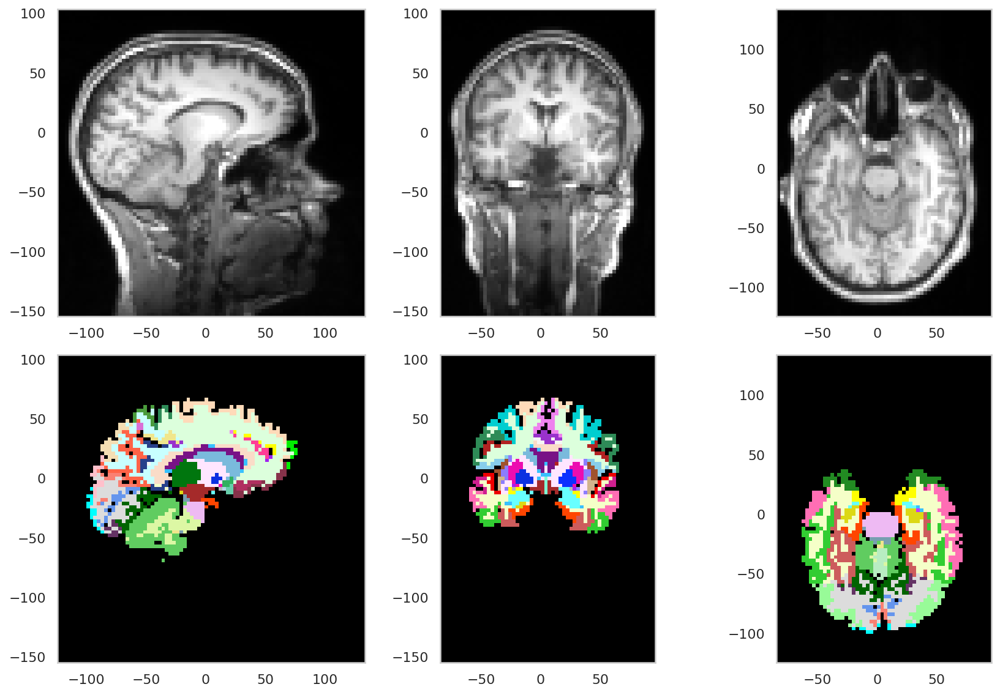

In [12]:
std = tio.Resample.get_sigma(downsampling_factor, 1)
antialiasing = tio.RandomBlur((std, std))
blurry = antialiasing(fpg_ras)
downsampled_antialiasing = downsample(blurry)
show_fpg(downsampled_antialiasing)

Another handy use for the `Resample` transform is to apply a precomputed transformation to a standard space, such as the [MNI space](https://www.lead-dbs.org/about-the-mni-spaces/). The `FPG` dataset includes this transform:

In [13]:
np.set_printoptions(precision=2, suppress=True)
fpg.t1['affine_matrix'].numpy()

array([[ 1.03, -0.01, -0.04, -4.59],
       [ 0.  ,  0.94,  0.3 , -5.97],
       [ 0.03, -0.32,  1.02, -0.78],
       [ 0.  ,  0.  ,  0.  ,  1.  ]])

We can provide a reference image for the resampling. Let's download [a dataset in the MNI space](http://www.bic.mni.mcgill.ca/ServicesAtlases/Colin27) included in TorchIO.

Extracting /root/.cache/torchio/mni_colin27_1998_nifti/mni_colin27_1998_nifti.zip to /root/.cache/torchio/mni_colin27_1998_nifti



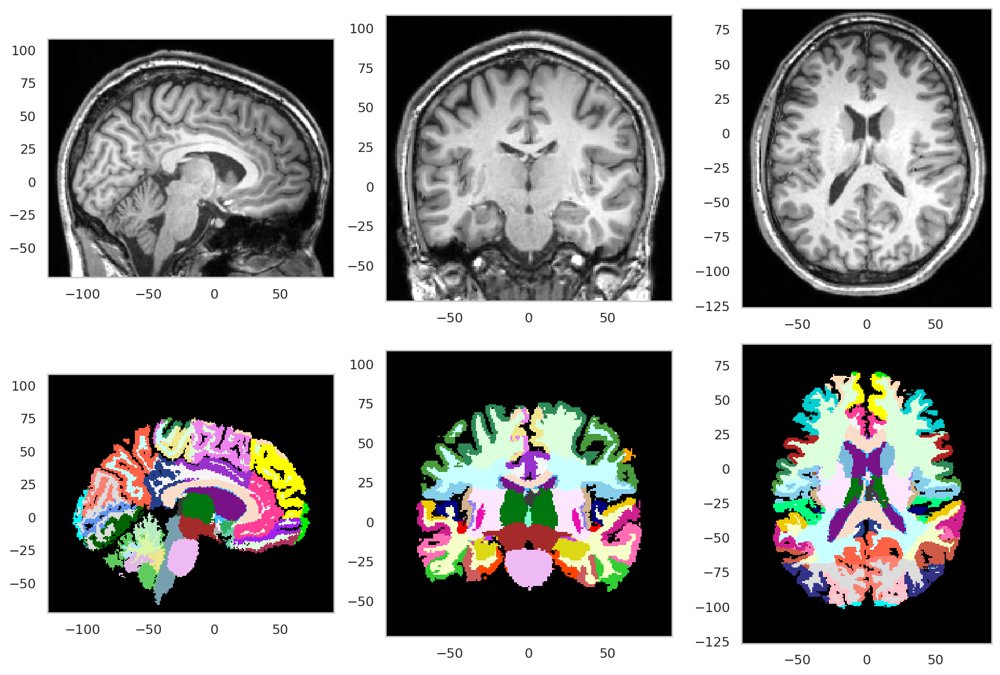

In [14]:
mni = tio.datasets.Colin27()
to_mni = tio.Resample(mni.t1.path, pre_affine_name='affine_matrix')
fpg_mni = to_mni(fpg_ras)
show_fpg(fpg_mni)

### Crop or pad

Sometimes there is a large part of the image without much information. To reduce the computational burden, we will use [`CropOrPad`](https://torchio.readthedocs.io/transforms/preprocessing.html#croporpad) to crop the image around the brain. If the target shape is larger than the input shape for any dimension, the image will be padded instead along that dimension. We will use a (not helpful) large size along the lateral dimension to show this feature.

In [15]:
fpg_ras.t1.spatial_shape

(176, 256, 256)

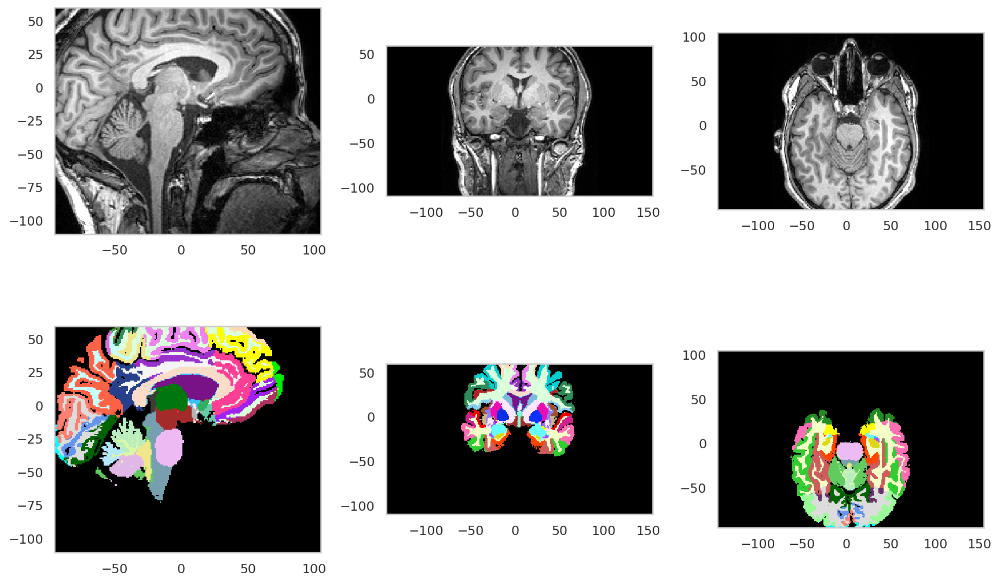

In [16]:
target_shape = 300, 200, 170
crop_pad = tio.CropOrPad(target_shape)
show_fpg(crop_pad(fpg_ras))

If we don't know where the region of interest (ROI) is in the image, but have a segmentation of it, we can use it to perform the cropping/padding by setting the center of the image to be the center of the ROI.

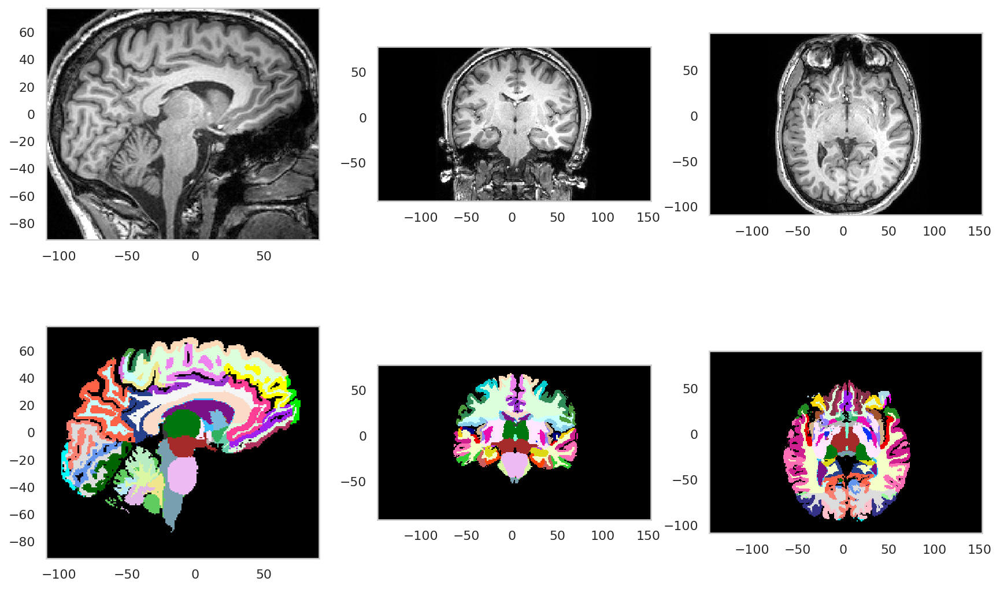

In [17]:
target_shape = 300, 200, 170
crop_pad = tio.CropOrPad(target_shape, mask_name='seg')
show_fpg(crop_pad(fpg_ras))

If our images are in a standard space, we probably have a good idea of the shape we need so that our image is large enough to fit our ROI but small enough for computations to be less expensive.

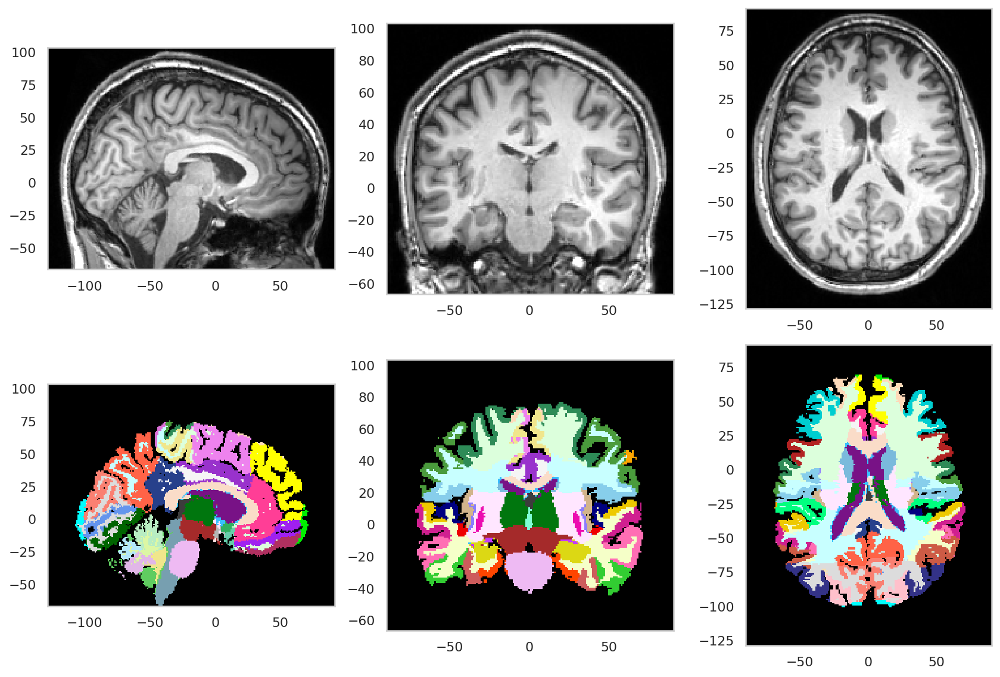

In [18]:
target_shape = 180, 220, 170
crop_pad = tio.CropOrPad(target_shape)
show_fpg(crop_pad(fpg_mni))

### Random downsample

Many medical images are acquired with anisotropic spacing, i.e. voxels are not cubes. Researchers typically use anisotropic resampling for preprocessing before feeding the images into a neural network. We can simulate this effect downsampling our image along a specific dimension and resampling back to an isotropic spacing.

To make the transform reproducible, we have passed a `seed` kwarg to the transform.

Original spacing: (1.0, 1.0, 1.0)
After random downsampling: (1.0, 1.0, 2.8400230407714844)


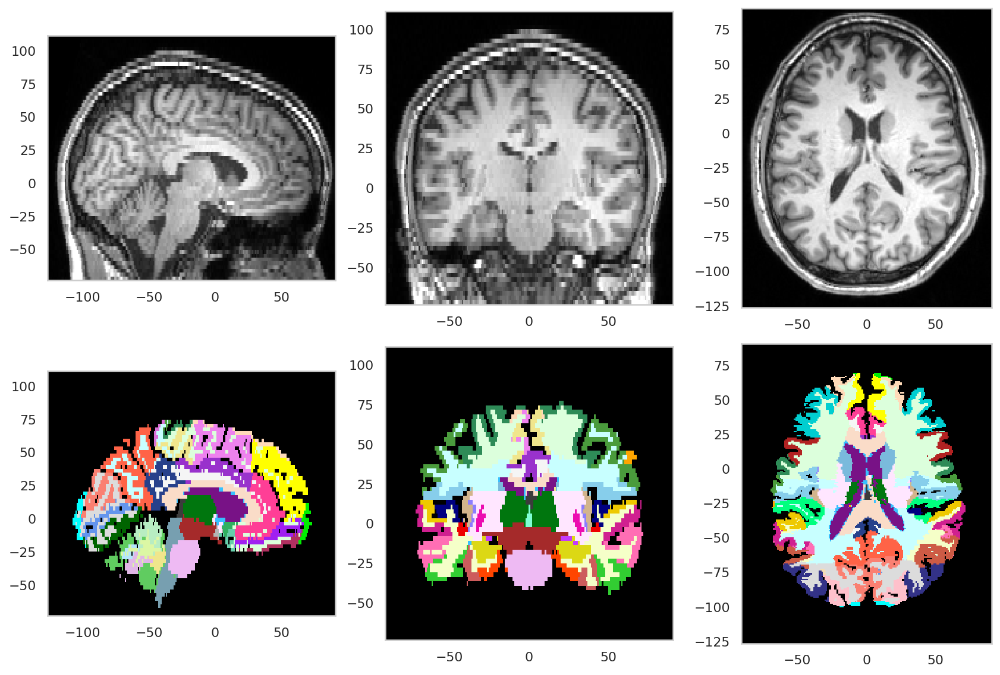

In [19]:
random_downsample = tio.RandomDownsample(seed=42)
fpg_anisotropic = random_downsample(fpg_mni)
print('Original spacing:', fpg_mni.spacing)
print('After random downsampling:', fpg_anisotropic.spacing)
show_fpg(fpg_anisotropic)

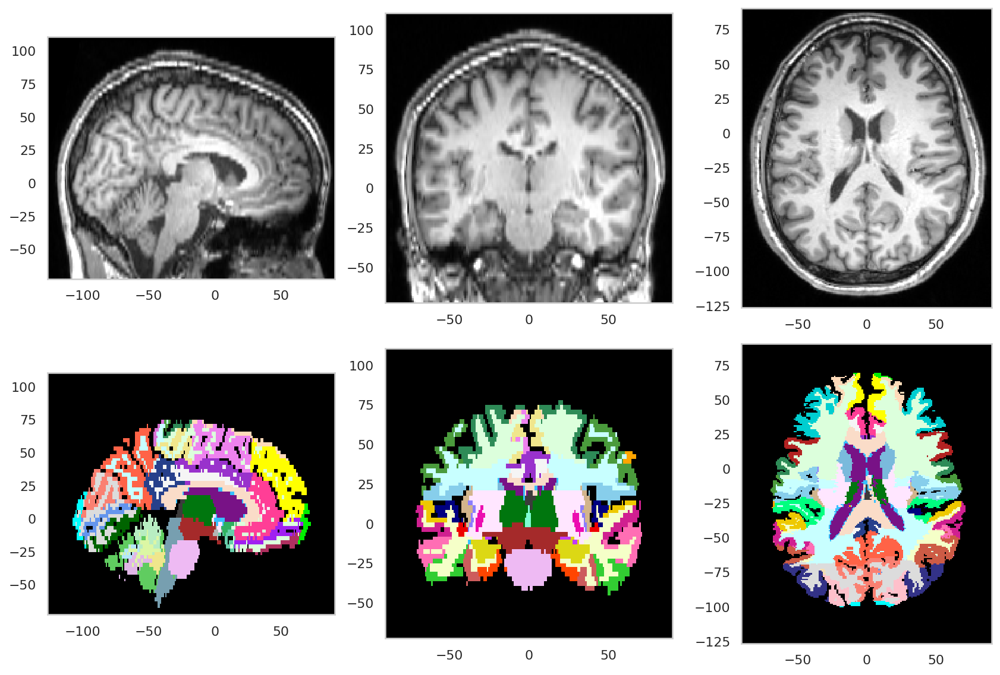

In [20]:
resample_back = tio.Resample(fpg_mni.spacing)
fpg_restored = resample_back(fpg_anisotropic)
show_fpg(fpg_restored)

### Random affine

To simulate different positions and size of the patient within the scanner, we can use a [`RandomAffine`](https://torchio.readthedocs.io/transforms/augmentation.html#randomaffine) transform.

To improve visualization, we will use a 2D image and add a grid to it.

Downloaded slice: ScalarImage(shape: (1, 1, 641, 361); spacing: (1.06, 1.06, 1.06); orientation: RAS+; memory: 903.9 KiB; type: intensity)


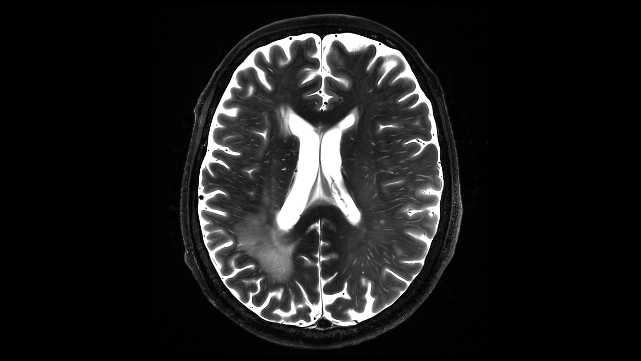

In [21]:
image = tio.ScalarImage('slice_7t.jpg')
spacing = image.spacing[-1]
downsampling = 3
image = tio.Resample(spacing * downsampling)(image)
print('Downloaded slice:', image)
to_pil(image)

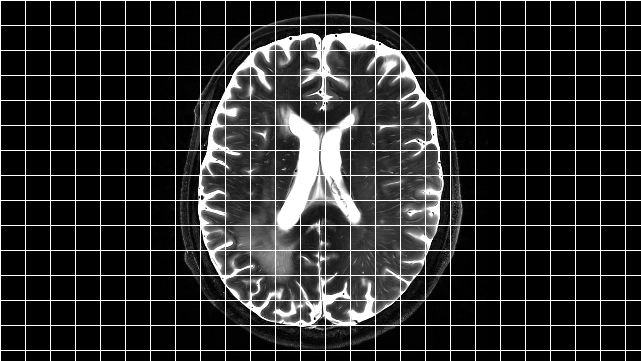

In [22]:
slice_grid = copy.deepcopy(image)
data = slice_grid.data
white = data.max()
N = 25
data[..., ::N] = white
data[..., ::N, :] = white
to_pil(slice_grid)

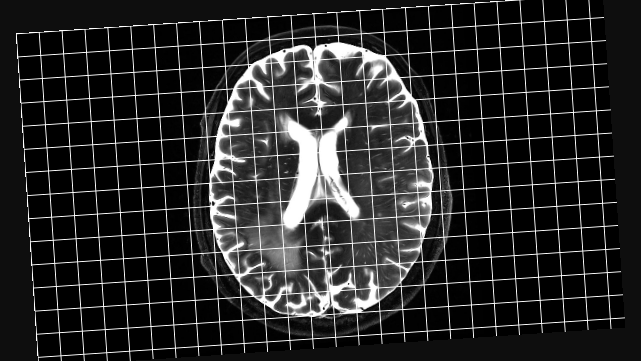

In [23]:
random_affine = tio.RandomAffine(seed=0)
slice_affine = random_affine(slice_grid)
to_pil(slice_affine)

This transform can be used to zoom in or out, changing the `scales` kwarg.

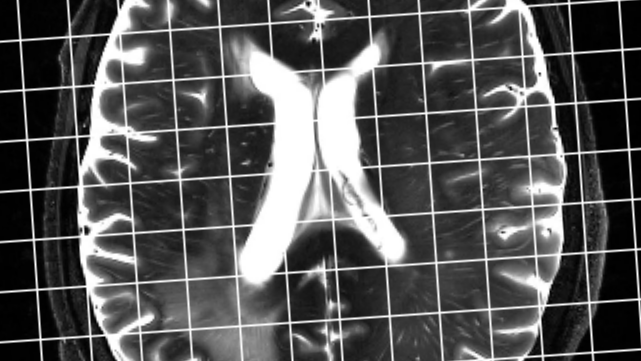

In [24]:
random_affine_zoom = tio.RandomAffine(scales=(2, 2), seed=0)
slice_affine = random_affine_zoom(slice_grid)
to_pil(slice_affine)

### Random flip

Flipping images is a very cheap way to perform data augmentation. In medical images, it's very common to flip the images horizontally. We can specify the dimensions indices when instantiating a [`RandomFlip`](https://torchio.readthedocs.io/transforms/augmentation.html#torchio.transforms.RandomFlip) transform.

However, if we don't know the image orientation, we can't know which dimension corresponds to the lateral axis. In TorchIO, you can use anatomical labels instead, so that you don't need to figure out image orientation to know which axis you would like to flip.

To make sure the transform modifies the image, we will use the inferior-superior axis and a flip probability of 1.

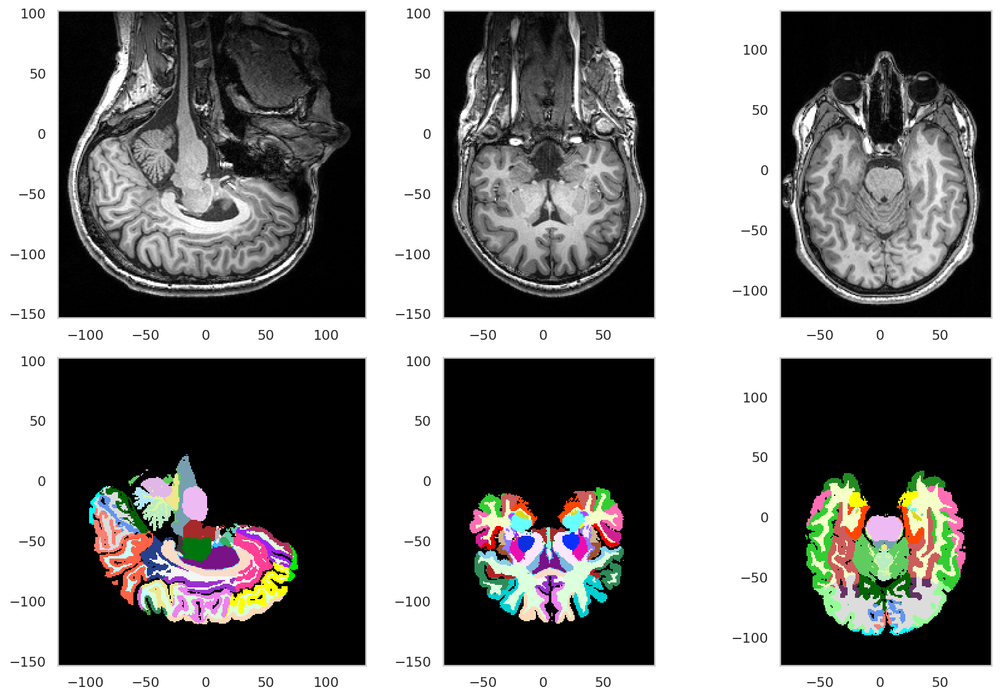

In [25]:
random_flip = tio.RandomFlip(axes=[2], flip_probability=1)  # TODO: use anatomy
fpg_flipped = random_flip(fpg_ras)
show_fpg(fpg_flipped)

### Random elastic deformation

To simulate anatomical variations in our images, we can apply a non-linear deformation using [`RandomElasticDeformation`](https://torchio.readthedocs.io/transforms/augmentation.html#torchio.transforms.RandomElasticDeformation).

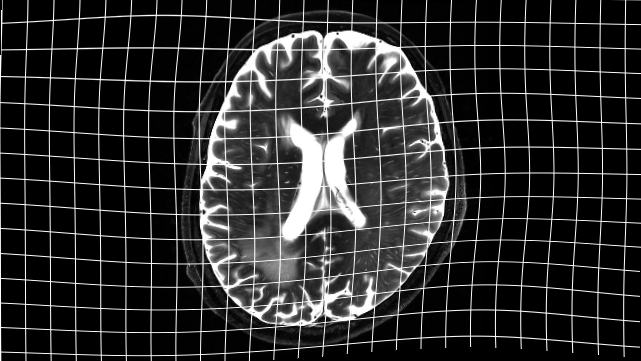

In [26]:
random_elastic = tio.RandomElasticDeformation(max_displacement=(0, 20, 40), seed=0)
slice_elastic = random_elastic(slice_grid)
to_pil(slice_elastic)

 As explained in the documentation, one can change the number of grid control points to set the deformation smoothness.

/usr/local/lib/python3.6/dist-packages/torchio/transforms/augmentation/spatial/random_elastic_deformation.py:215: RuntimeWarning: The maximum displacement is larger than the coarse grid spacing for dimensions: [1, 2], so folding may occur. Choose fewer control points or a smaller maximum displacement
  warnings.warn(message, RuntimeWarning)


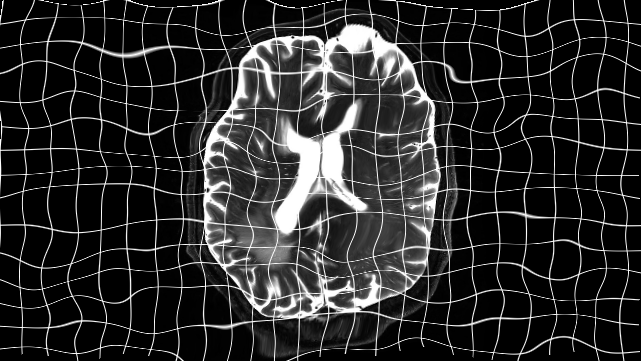

In [27]:
random_elastic = tio.RandomElasticDeformation(
    max_displacement=(0, 20, 40),
    num_control_points=20,
    seed=0,
)
slice_elastic = random_elastic(slice_grid)
to_pil(slice_elastic)

## Intensity transforms

Intensity transforms modify the only scalar images, whereas label maps are left as they were.

### Rescale intensity

We can change the intensities range of our images so that it lies within e.g. 0 and 1, or -1 and 1, using [`RescaleIntensity`](https://torchio.readthedocs.io/transforms/preprocessing.html#rescaleintensity).

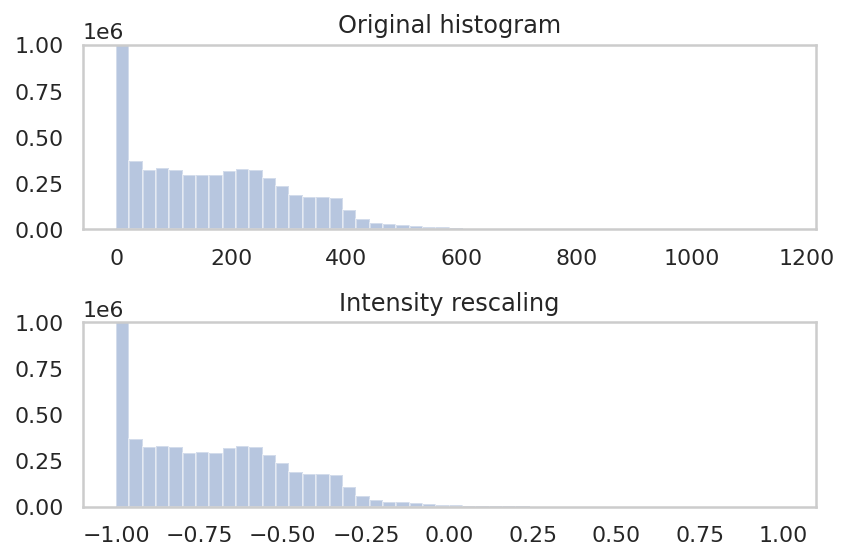

In [28]:
rescale = tio.RescaleIntensity((-1, 1))
rescaled = rescale(fpg)
fig, axes = plt.subplots(2, 1)
sns.distplot(fpg.t1.data, ax=axes[0], kde=False)
sns.distplot(rescaled.t1.data, ax=axes[1], kde=False)
axes[0].set_title('Original histogram')
axes[1].set_title('Intensity rescaling')
axes[0].set_ylim((0, 1e6))
axes[1].set_ylim((0, 1e6))
plt.tight_layout()

There seem to be some outliers with very high intensity. We might be able to get rid of those by mapping some percentiles to our final values.

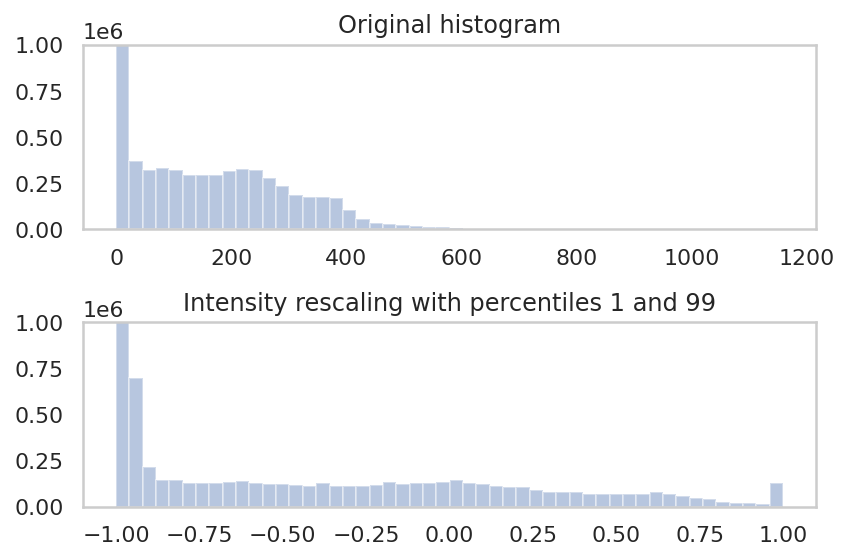

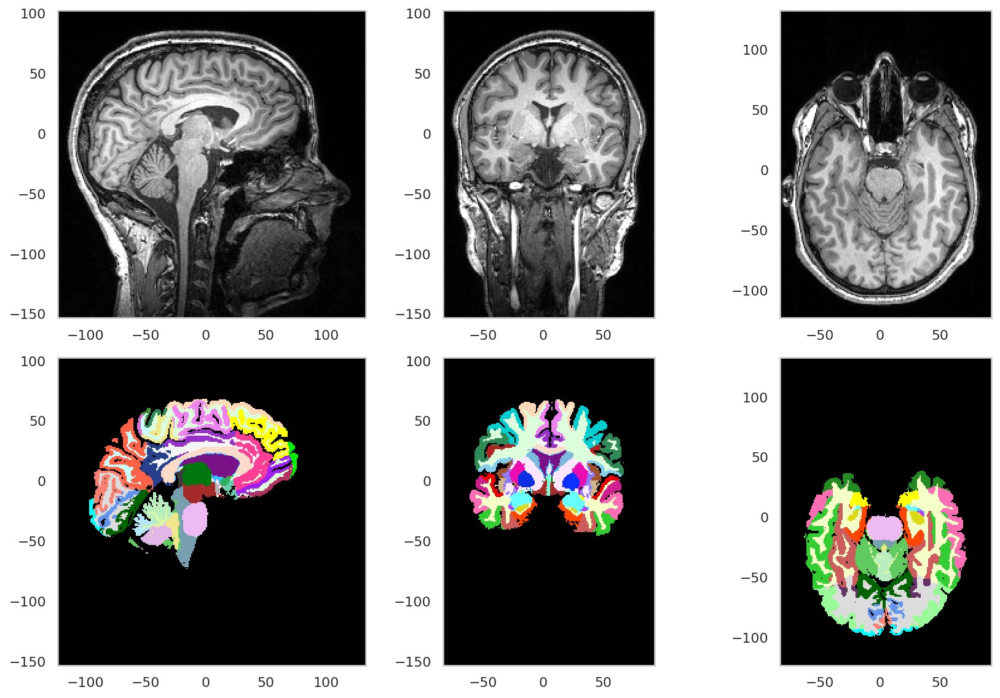

In [29]:
rescale = tio.RescaleIntensity((-1, 1), percentiles=(1, 99))
rescaled = rescale(fpg_ras)
fig, axes = plt.subplots(2, 1)
sns.distplot(fpg.t1.data, ax=axes[0], kde=False)
sns.distplot(rescaled.t1.data, ax=axes[1], kde=False)
axes[0].set_title('Original histogram')
axes[1].set_title('Intensity rescaling with percentiles 1 and 99')
axes[0].set_ylim((0, 1e6))
axes[1].set_ylim((0, 1e6))
plt.tight_layout()
show_fpg(rescaled)

### Z-normalization

Another common approach for normalization is forcing data points to have zero-mean and unit variance. We can use [`ZNormalization`](https://torchio.readthedocs.io/transforms/preprocessing.html#znormalization) for this.

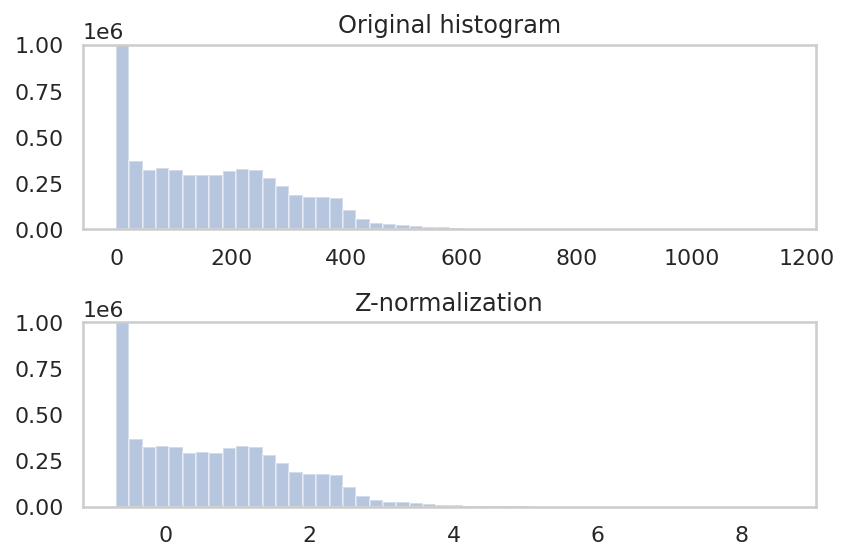

In [30]:
standardize = tio.ZNormalization()
standardized = standardize(fpg)
fig, axes = plt.subplots(2, 1)
sns.distplot(fpg.t1.data, ax=axes[0], kde=False)
sns.distplot(standardized.t1.data, ax=axes[1], kde=False)
axes[0].set_title('Original histogram')
axes[1].set_title('Z-normalization')
axes[0].set_ylim((0, 1e6))
axes[1].set_ylim((0, 1e6))
plt.tight_layout()

The second mode in our distribution, corresponding to the foreground, is far from zero because the background contributes a lot to the mean computation. We can compute the stats using e.g. values above the mean only. Let's see if the mean is a good threshold to segment the foreground.

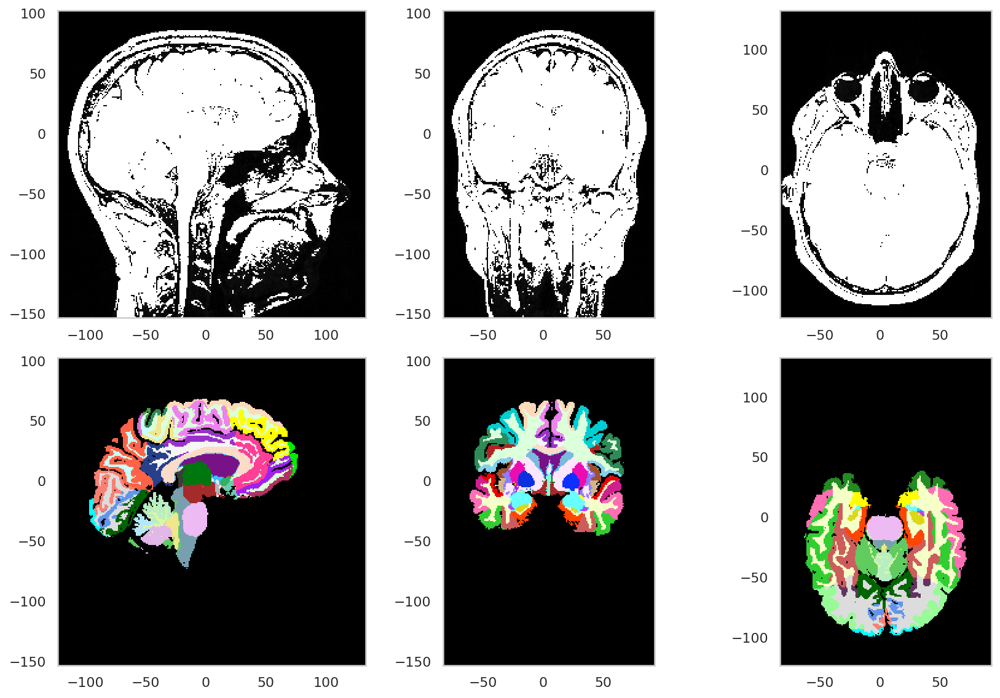

In [31]:
fpg_thresholded = copy.deepcopy(fpg_ras)
data = fpg_thresholded.t1.data
data[data > data.mean()] = data.max()
show_fpg(fpg_thresholded)

It seems that we can use this ROI to compute the stats for our normalization transform.

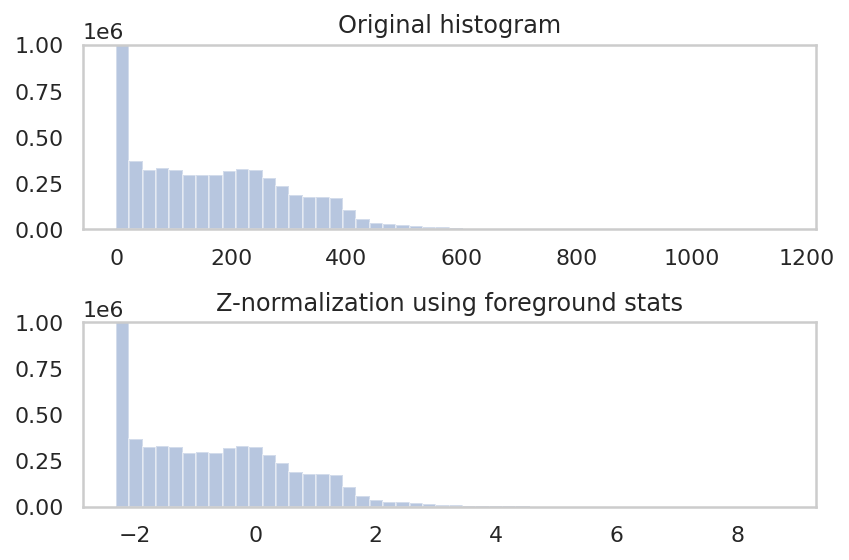

In [32]:
standardize_foreground = tio.ZNormalization(masking_method=lambda x: x > x.mean())
standardized_foreground = standardize_foreground(fpg)
fig, axes = plt.subplots(2, 1)
sns.distplot(fpg.t1.data, ax=axes[0], kde=False)
sns.distplot(standardized_foreground.t1.data, ax=axes[1], kde=False)
axes[0].set_title('Original histogram')
axes[1].set_title('Z-normalization using foreground stats')
axes[0].set_ylim((0, 1e6))
axes[1].set_ylim((0, 1e6))
plt.tight_layout()

The second mode is now closer to zero, as only the foreground voxels have been used to compute the statistics.

### Histogram standardization

[Histogram standardization](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.204.102&rep=rep1&type=pdf) is yet another technique we can use to normalize our data. First, a set of landmarks is created from a training set. Then, images can be normalized by matching their histograms to the training landmarks.

We will use the landmarks from an ADNI dataset, computed by [Li et al.](https://arxiv.org/abs/1707.01992).

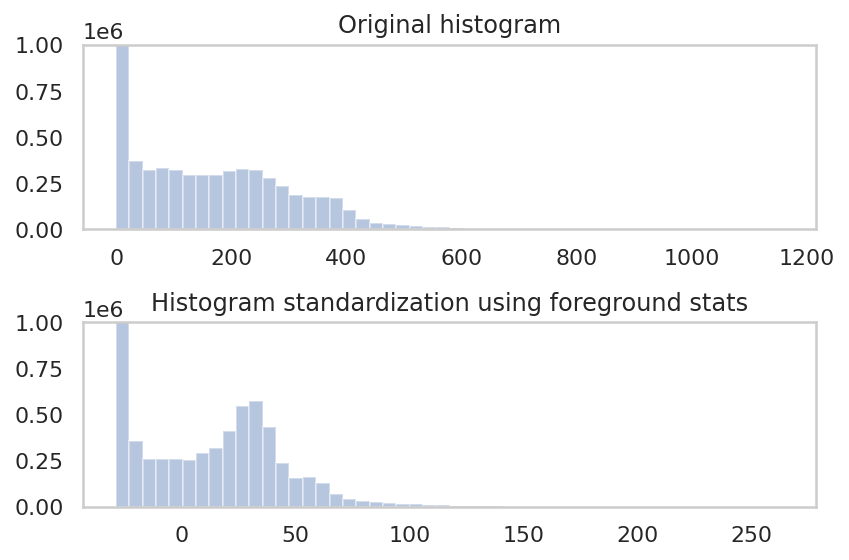

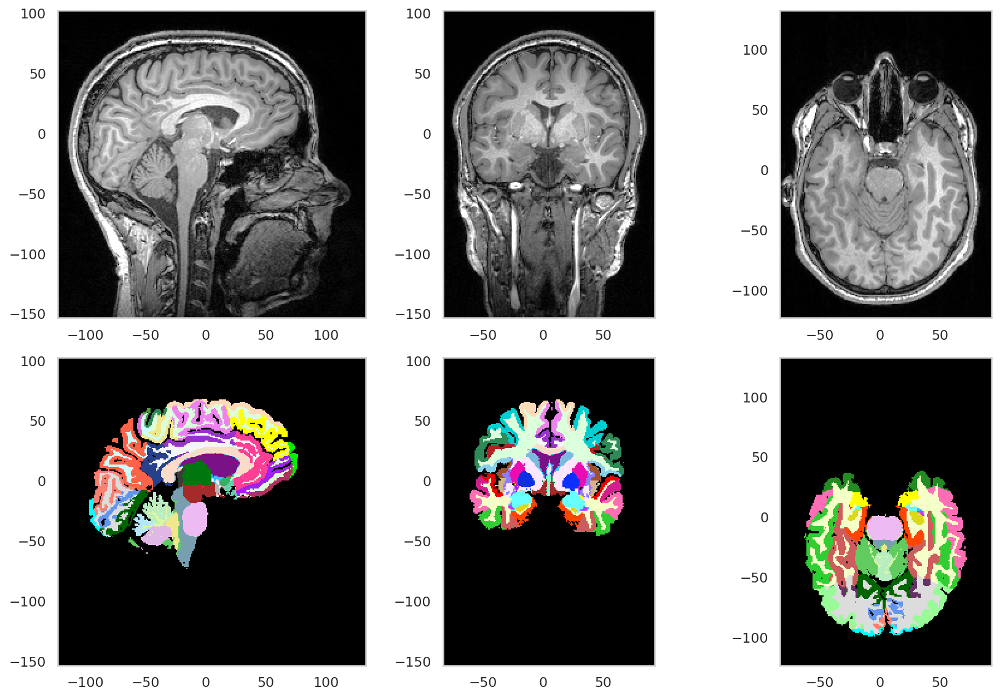

In [33]:
# From NiftyNet model zoo
LI_LANDMARKS = "0 8.06305571158 15.5085721044 18.7007018006 21.5032879029 26.1413278906 29.9862059045 33.8384058795 38.1891334787 40.7217966068 44.0109152758 58.3906435207 100.0"
LI_LANDMARKS = np.array([float(n) for n in LI_LANDMARKS.split()])
landmarks_dict = {'t1': LI_LANDMARKS}
hist_standardize = tio.HistogramStandardization(landmarks_dict, masking_method=lambda x: x > x.mean())
hist_standard = hist_standardize(fpg_ras)
fig, axes = plt.subplots(2, 1)
sns.distplot(fpg.t1.data, ax=axes[0], kde=False)
sns.distplot(hist_standard.t1.data, ax=axes[1], kde=False)
axes[0].set_title('Original histogram')
axes[1].set_title('Histogram standardization using foreground stats')
axes[0].set_ylim((0, 1e6))
axes[1].set_ylim((0, 1e6))
plt.tight_layout()
show_fpg(hist_standard)

### Random blur

We can use [`RandomBlur`](https://torchio.readthedocs.io/transforms/augmentation.html#torchio.transforms.RandomBlur) to smooth/blur the images. The standard deviation will be computed independently for each axis.

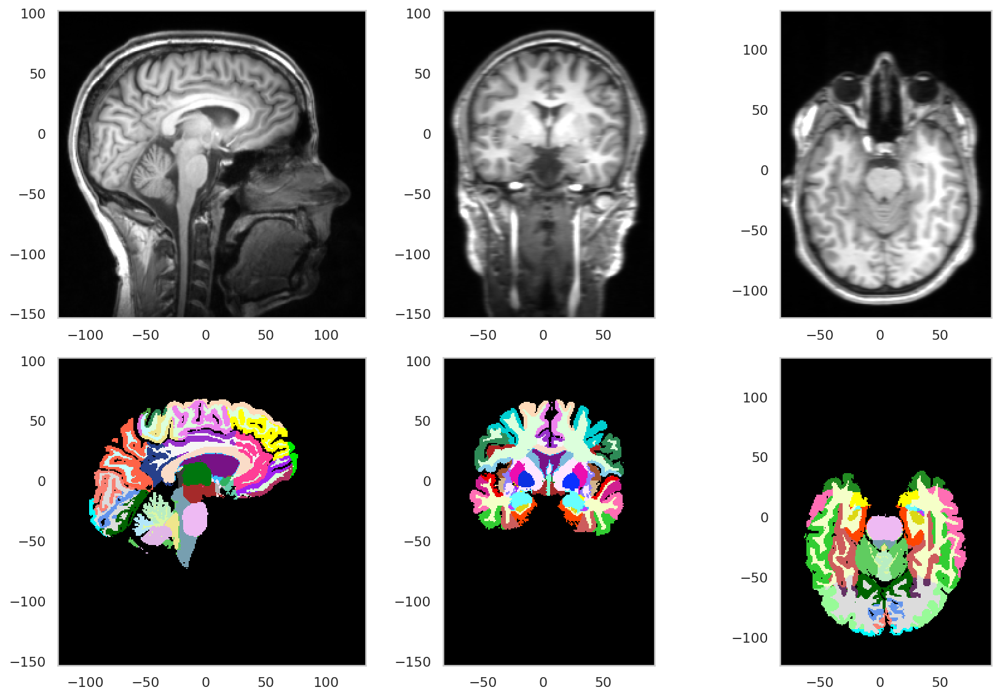

In [34]:
blur = tio.RandomBlur(seed=0)
blurred = blur(fpg_ras)
show_fpg(blurred)

### Random noise

Gaussian noise can be simulated using [`RandomNoise`](https://torchio.readthedocs.io/transforms/augmentation.html#randomnoise). This transform is easiest to use after [`ZNormalization`](https://torchio.readthedocs.io/transforms/preprocessing.html#torchio.transforms.ZNormalization), as we know beforehand the mean and standard deviation of the input will be 0 and 1, respectively.

Noise in MRI is actually [Rician](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2254141/), but it is nearly Gaussian for SNR > 2 (i.e. foreground).

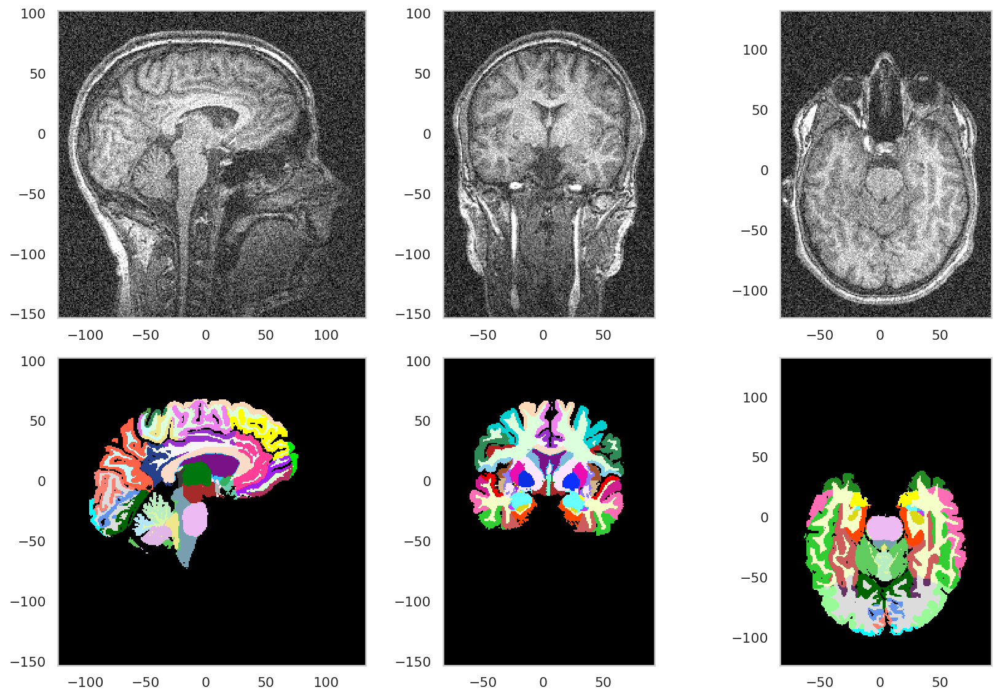

In [35]:
add_noise = tio.RandomNoise(std=0.5, seed=42)
standard = standardize(fpg_ras)
noisy = add_noise(standard)
show_fpg(noisy)

### MRI-specific transforms

TorchIO includes some transforms to simulate image artifacts specific to MRI modalities.

#### Random bias field

Magnetic field inhomogeneities in the MRI scanner produce low-frequency intensity distortions in the images, which are typically corrected using algorithms such as [N4ITK](https://pubmed.ncbi.nlm.nih.gov/20378467/). To simulate this artifact, we can use [`RandomBiasField`](https://torchio.readthedocs.io/transforms/augmentation.html#torchio.transforms.RandomBiasField).

For this example, we will use an image that has been preprocessed so it's meant to be unbiased.

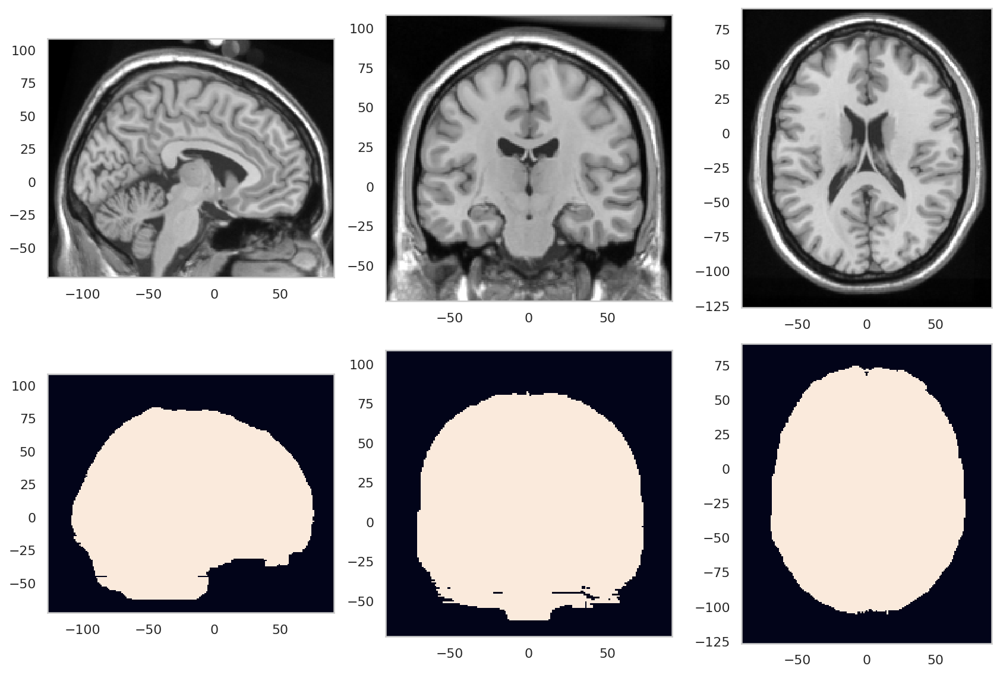

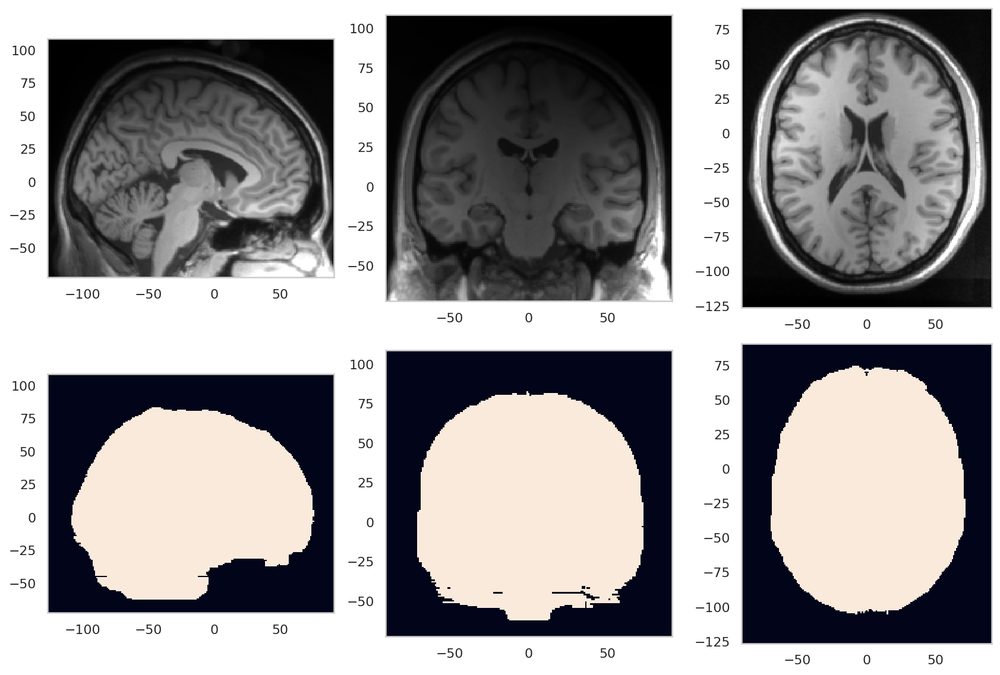

In [36]:
add_bias = tio.RandomBiasField(coefficients=1, seed=0)
mni.seg = mni.brain
show_fpg(mni)
mni_bias = add_bias(mni)
mni_bias.seg = mni_bias.brain
show_fpg(mni_bias)

#### $k$-space transforms

MR images are generated by computing the inverse Fourier transform of the $k$-space, which is the signal received by the coils in the scanner. If the $k$-space is altered, an artifact will be created in the image. These artifacts are typically accidental, but we can use transforms to simulate them.

##### Random spike

Sometimes, signal peaks can appear in $k$-space. If one adds a high-energy component at e.g. 440 Hz in the spectrum of an audio signal, a tone of that frequency will be audible in the time domain. Similarly, spikes in $k$-space manifest as stripes in image space. They can be simulated using [`RandomSpike`](https://torchio.readthedocs.io/transforms/augmentation.html#torchio.transforms.RandomSpike).

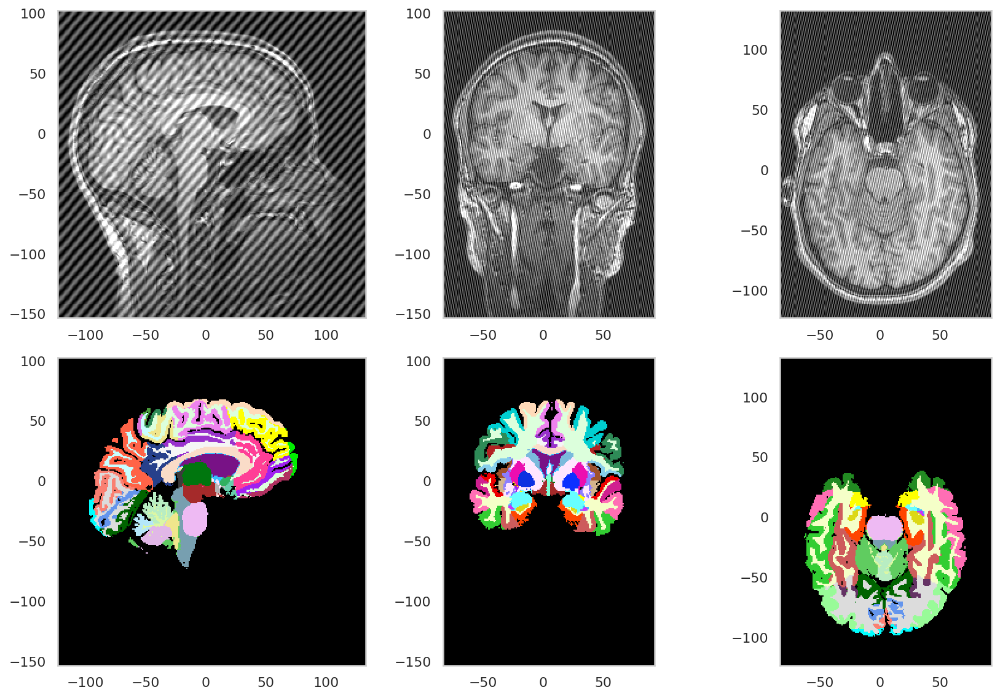

In [37]:
add_spike = tio.RandomSpike(seed=42)
with_spike = add_spike(fpg_ras)
show_fpg(with_spike)

##### Random ghosting

Ghosting artifacts, caused by patient motion, can be simlated by removing every $n$th plane from the k-space, and can be generated using [`RandomGhosting`](https://torchio.readthedocs.io/transforms/augmentation.html#randomghosting).

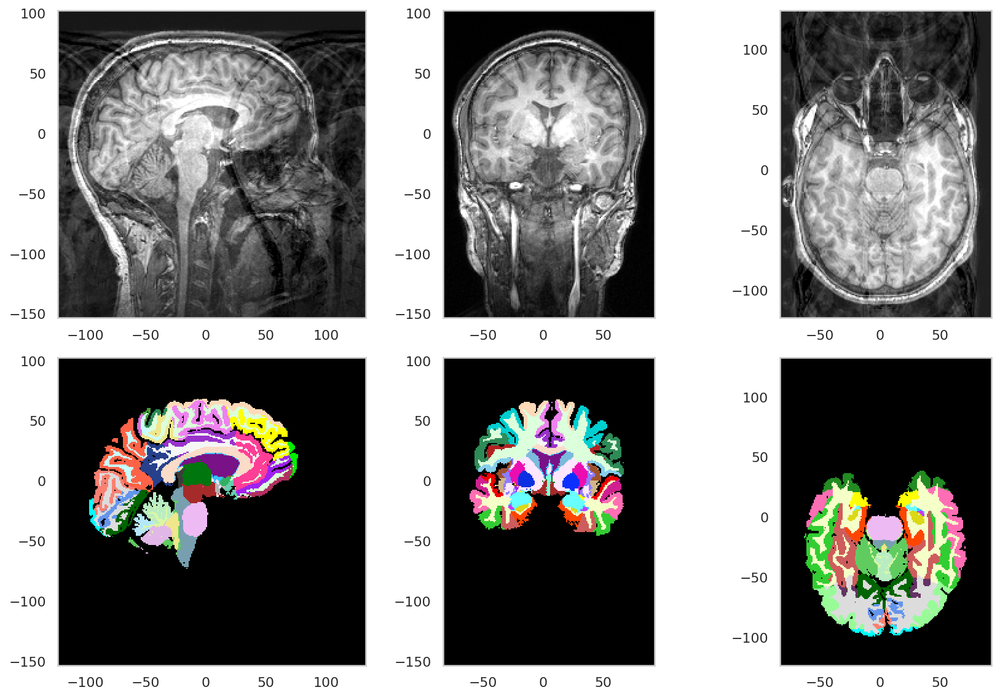

In [38]:
add_ghosts = tio.RandomGhosting(intensity=1.5, seed=42)
with_ghosts = add_ghosts(fpg_ras)
show_fpg(with_ghosts)

##### Random motion

If the patient moves during the MRI acquisition, motion artifacts will be present. TorchIO includes an implementation of [Shaw et al.](http://proceedings.mlr.press/v102/shaw19a.html), where the artifact is generated by filling the $k$-space with random rigidly-transformed versions of the original images and computing the inverse transform of the compound $k$-space.

Computing the direct and inverse Fourier transform takes some time, so we'll use nearest neighbor interpolation to resample faster.

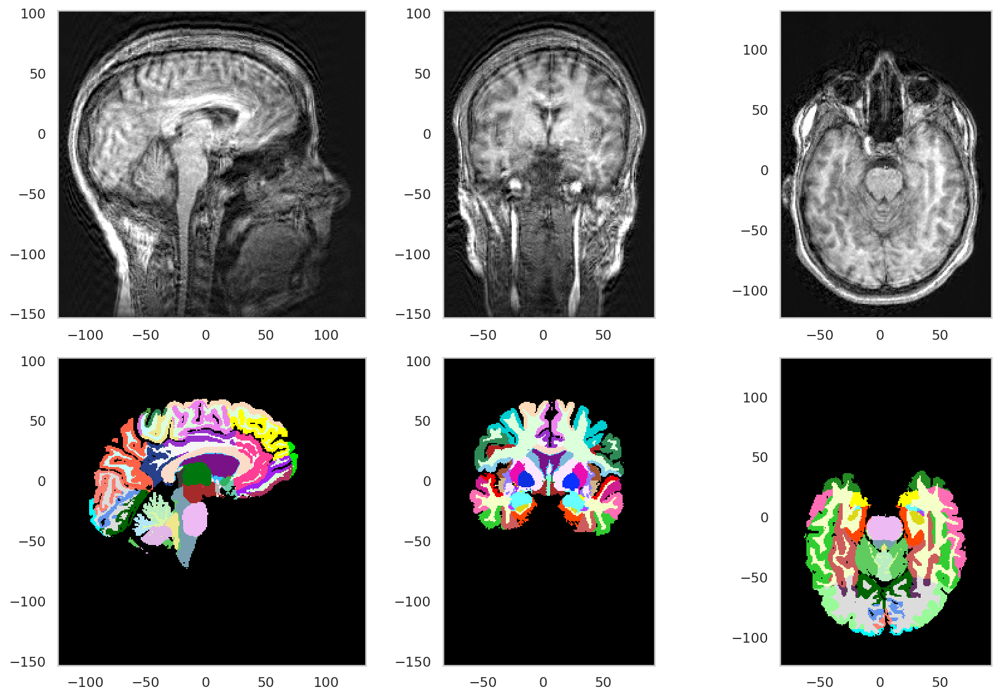

In [39]:
add_motion = tio.RandomMotion(num_transforms=6, image_interpolation='nearest', seed=42)
with_motion = add_motion(fpg_ras)
show_fpg(with_motion)

### Implementations of recent papers

TorchIO transforms can be written to implement more complex or higher-level operations. These are some examples of transforms that implement recent studies or have been used in them.

#### Random swap

[Chen et al.](https://www.sciencedirect.com/science/article/abs/pii/S1361841518304699) randomly swapped small image patches to perform image restoration as a pretext task for self-supervised learning. This can be replicated using [`RandomSwap`](https://torchio.readthedocs.io/transforms/augmentation.html#randomswap).

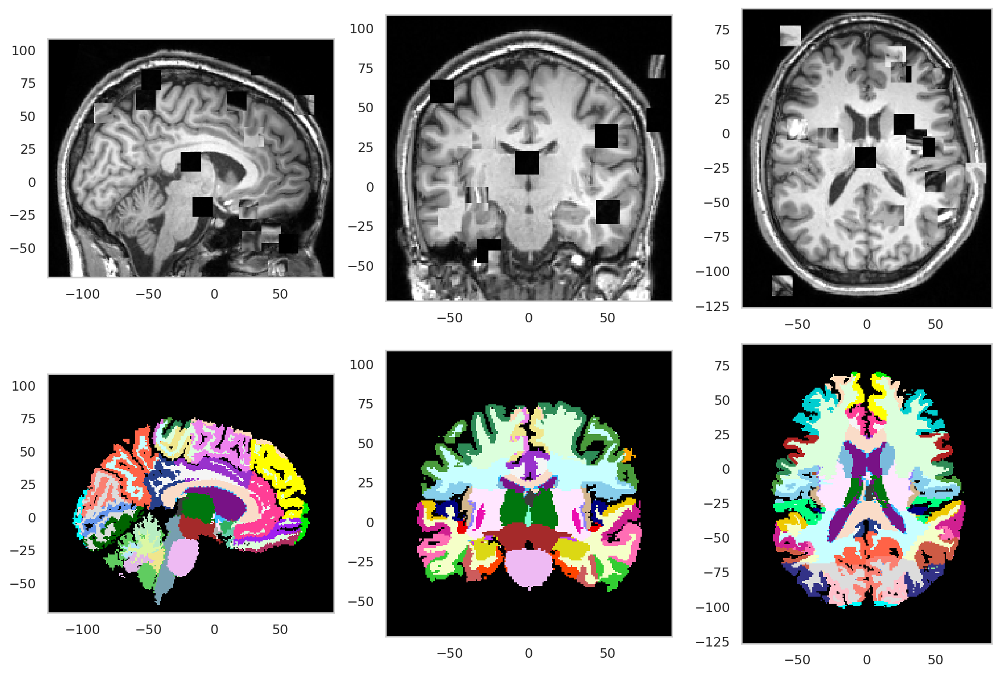

In [40]:
swap = tio.RandomSwap()
swapped = swap(fpg_mni)
show_fpg(swapped)

#### Random labels to image

[Billot et al.](https://github.com/BBillot/SynthSeg) generated images with different contrasts using only tissue segmentations, obtaining great results for modality-agnostic image segmentation. [`RandomLabelsToImage`](https://torchio.readthedocs.io/transforms/augmentation.html#randomlabelstoimage) can be used to generate this type of images.

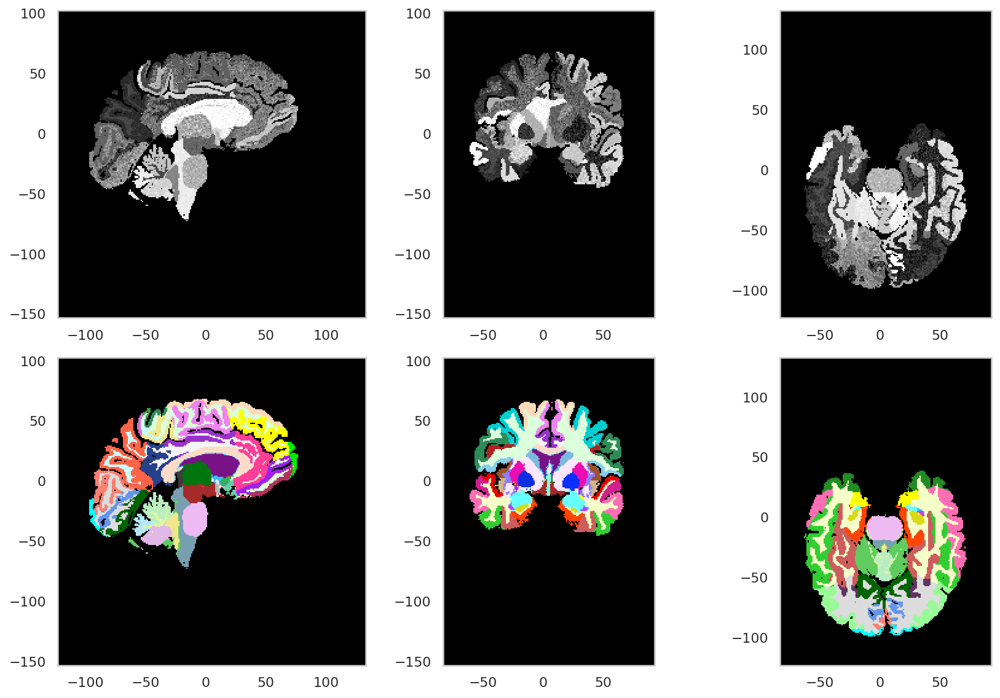

In [41]:
lab2im = tio.RandomLabelsToImage(label_key='seg', image_key='t1')
fpg_copy = tio.Subject(t1=fpg_ras.seg, seg=fpg_ras.seg)
data = fpg_copy.seg.data
data[data < 5] = 0  # remove some structures we don't need
labels_image = lab2im(fpg_copy)
show_fpg(labels_image)

#### Random resection

[Pérez-García et al.](https://arxiv.org/abs/2006.15693) simulated brain resection cavities from healthy subjects to pre-train a segmentation model using self-supervised learning. We will first download and install the [`resector`](https://github.com/fepegar/resector) package.

In [42]:
!git clone --quiet https://github.com/fepegar/resector.git
!pip install --quiet --editable ./resector

     |████████████████████████████████| 133kB 3.4MB/s 
     |████████████████████████████████| 103.4MB 103kB/s 


Now we can use the `resect` command to apply to the transform. The first time it is run, it will take some time as it needs to generate some files necessary to simulate the resection.

In [43]:
fpg_mni.t1.save('t1.nii.gz')
fpg_mni.seg.save('gif_parcellation.nii.gz')
!resect t1.nii.gz gif_parcellation.nii.gz t1_resected.nii.gz t1_resection_label.nii.gz --min-volume 1000

If you use TorchIO for your research, please cite the following paper:
Pérez-García et al., TorchIO: a Python library for efficient loading,
preprocessing, augmentation and patch-based sampling of medical images
in deep learning. Link: https://arxiv.org/abs/2003.04696



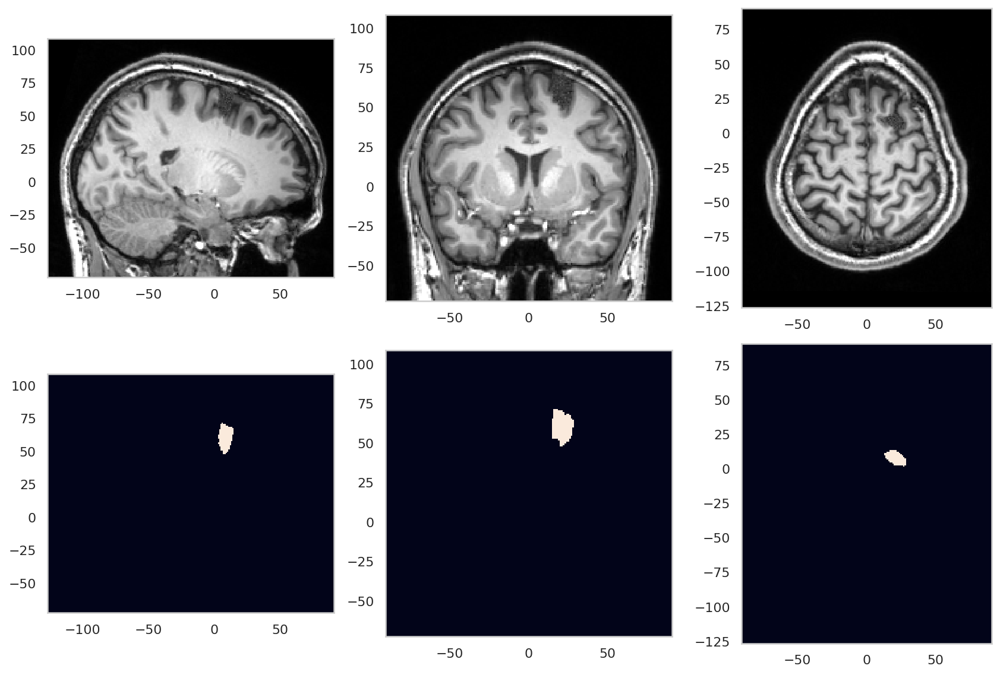

In [44]:
resected = tio.Subject(
    t1=tio.ScalarImage('t1_resected.nii.gz'),
    seg=tio.LabelMap('t1_resection_label.nii.gz')
)
centroid = np.array(np.where(resected.seg.data)).mean(axis=1).astype(np.uint16)[-3:]
show_fpg(resected, indices=centroid)

## Lambda

The fastest way to implement a custom transform is using [`Lambda`](https://torchio.readthedocs.io/transforms/others.html#lambda). This transform needs a callable object which applies a transform to a 4D image. We will use a histology slice to show a usage example.

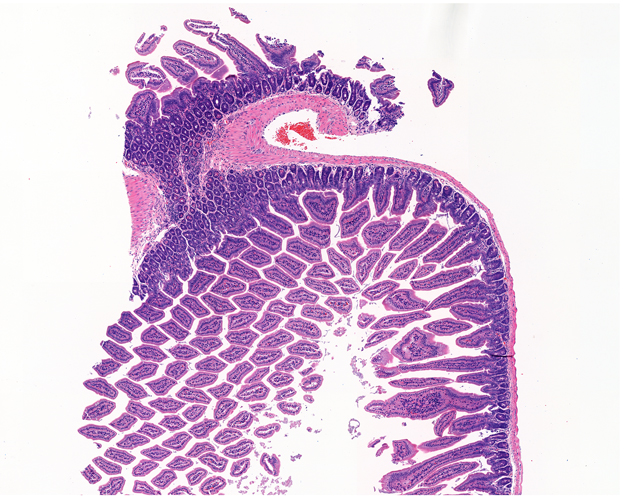

In [45]:
rgb = tio.ScalarImage('slice_histo.jpg')
to_pil(rgb)

We will pass a function that swaps the red and blue channels of the RGB image.

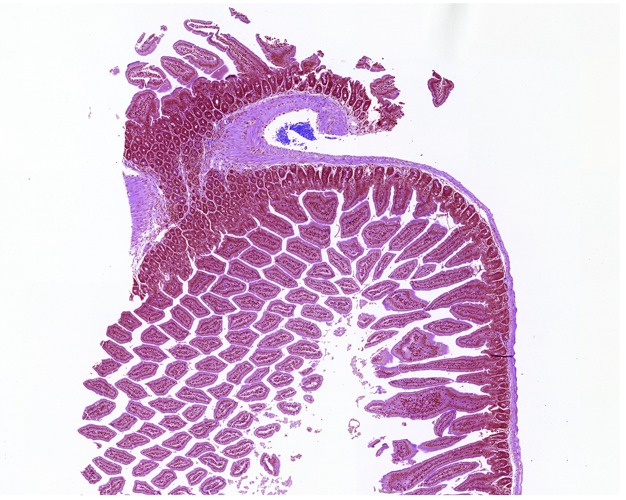

In [46]:
def rgb_to_bgr(tensor):
    tensor = torch.from_numpy(tensor.numpy()[::-1].copy())
    return tensor

transform = tio.Lambda(rgb_to_bgr)
bgr = transform(rgb)
to_pil(bgr)

## Composition

It's useful to chain transforms together so that they can be applied with a single statement, instead of a `for` loop.


### Compose

Transforms can be easily chained together using [`Compose`](https://torchio.readthedocs.io/transforms/augmentation.html#torchio.transforms.Compose). It is like [`torchvision.Compose`](https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Compose), but it takes a `p` kwarg representing the probability that the composition will be applied.

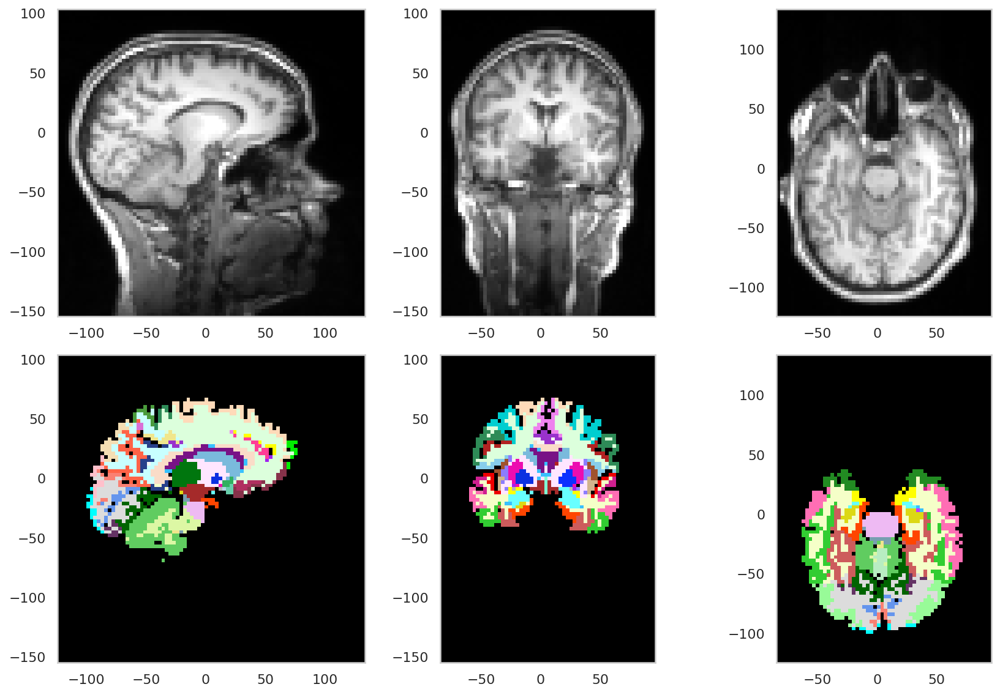

In [47]:
nice_downsample = tio.Compose([
    to_ras,
    antialiasing,
    downsample,                   
])
nice_down = nice_downsample(fpg)
show_fpg(nice_down)

### "One of"

Sometimes we would like to apply e.g. either a `RandomAffine` or a `RandomElasticDeformation`, instead of both. However, computing a `RandomAffine` is faster. Therefore, we might want it to happen to only 25% of images, not 50%. We can use [`OneOf`](https://torchio.readthedocs.io/transforms/augmentation.html#oneof) for this.

In [48]:
spatial_transform = tio.OneOf({
    tio.RandomAffine(): 0.75,
    tio.RandomElasticDeformation(): 0.25,
})

### Composition example

Do **not** use a seed for your random transforms during training! If you do, the same transform will be applied to every image.

Using downloaded and verified file: /root/.cache/torchio/fpg/t1.nii.gz
Using downloaded and verified file: /root/.cache/torchio/fpg/t1_seg_gif.nii.gz
Using downloaded and verified file: /root/.cache/torchio/fpg/t1_to_mni.tfm
Using downloaded and verified file: /root/.cache/torchio/fpg/t1_to_mni_affine.h5


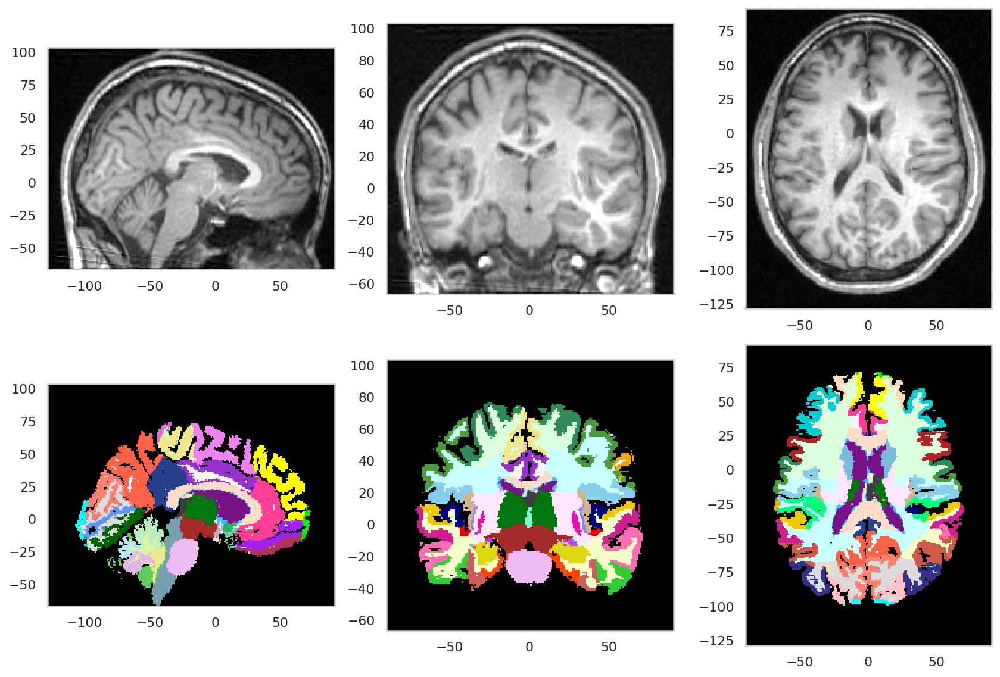

In [49]:
def get_foreground(x):
    return x > x.mean()

training_transform = tio.Compose([
    tio.RandomDownsample(p=0.5),               # make anisotropic 50% of times
    tio.Resample(
        mni.t1.path,
        pre_affine_name='affine_matrix'),      # to MNI space (which is RAS+)
    tio.CropOrPad((180, 220, 170)),            # tight crop around brain
    tio.HistogramStandardization(
        landmarks_dict,
        masking_method=get_foreground),        # standardize histogram of foreground
    tio.ZNormalization(
        masking_method=get_foreground),        # zero mean, unit variance of foreground
    tio.RandomBlur(p=0.5),                     # blur 50% of times
    tio.RandomNoise(p=0.5),                    # Gaussian noise 50% of times
    tio.OneOf({                                # either
        tio.RandomAffine(): 0.75,              # random affine
        tio.RandomElasticDeformation(): 0.25,  # or random elastic deformation
    }, p=0.8),                                 # applied to 80% of images
    tio.OneOf({                                # either
        tio.RandomBiasField(): 0.4,            # magnetic field inhomogeneity 40% * 0.8 = 32% of times
        tio.RandomMotion(): 0.2,               # or random motion artifact
        tio.RandomSpike(): 0.2,                # or spikes
        tio.RandomGhosting(): 0.2,             # or ghosts
    }, p=0.8),                                 # applied to 80% of images
])

fpg_training = tio.datasets.FPG()
fpg_augmented = training_transform(fpg_training)         # apply the transform
show_fpg(fpg_augmented)

Applying many transforms to large images can be slow. Tips to go faster:
1. Use nearest neighbor interpolation
2. Crop the volumes
3. Downsample the images
4. Use `OneOf` and the `p` kwarg wisely
5. Use a small number of transforms in `RandomMotion`
6. Use multiple workers in a `DataLoader`

Which random transforms have been applied? Using what parameters? All the information is saved in the `history` attribute of [`Subject`](https://torchio.readthedocs.io/data/subject.html).

In [56]:
for transform_name, transform_parameters in fpg_augmented.history:
    print('Applied:', transform_name)
print(f'Parameters for {transform_name}: {transform_parameters}')

Applied: RandomNoise
Applied: RandomElasticDeformation
Applied: RandomMotion
Parameters for RandomMotion: {'t1_channel_0': {'times': array([0.33, 0.72], dtype=float32), 'degrees': array([[-7.25, -0.15,  0.25],
       [-8.73,  3.43,  7.09]], dtype=float32), 'translation': array([[ 6.9 , -4.6 ,  5.35],
       [-1.43,  8.59, -1.44]], dtype=float32)}}


At test time, we only need the preprocessing transforms:

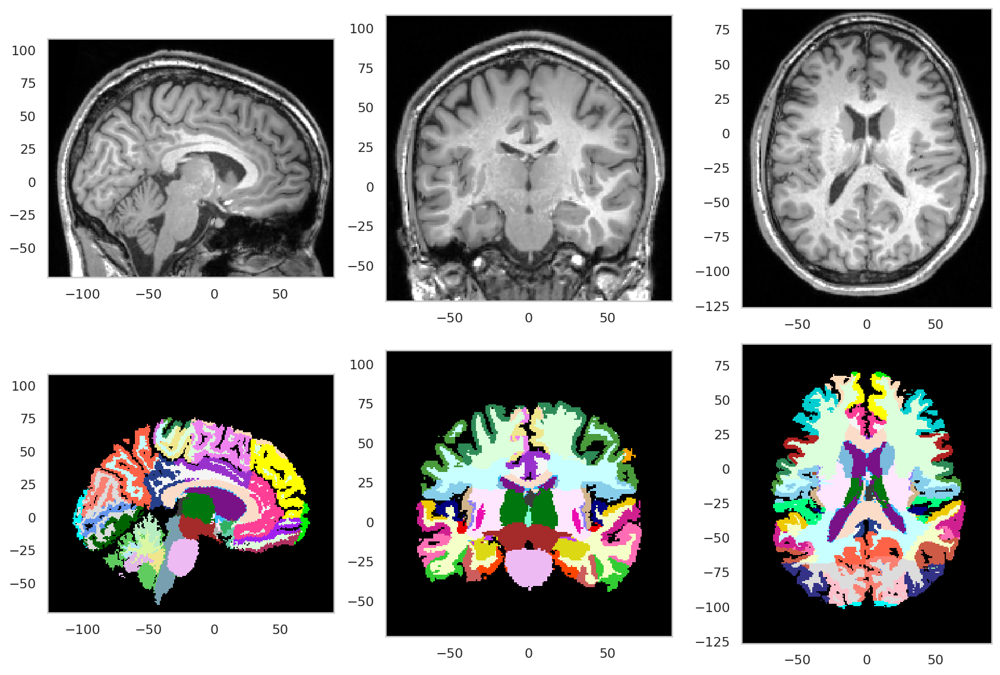

In [57]:
testing_transform = tio.Compose([
    tio.Resample(mni.t1.path, pre_affine_name='affine_matrix'),                   # to MNI space (which is RAS+)
    tio.HistogramStandardization(landmarks_dict, masking_method=get_foreground),  # standard histogram
    tio.ZNormalization(masking_method=get_foreground),                            # zero mean and unit std
])

fpg_testing = testing_transform(fpg)
show_fpg(fpg_testing)

## Other interfaces

You can still try out the transforms using a GUI or a CLI tool even without using Python.

### 3D Slicer

[3D Slicer](https://www.slicer.org/) is *an open source software platform for medical image informatics, image processing, and three-dimensional visualization*.

The [extensions index](https://www.slicer.org/wiki/Documentation/Nightly/SlicerApplication/ExtensionsManager) include the [TorchIO](https://torchio.readthedocs.io/slicer.html) extension, that can be used to try out the transforms and their parameters.

![TorchIO extension screenshot](https://raw.githubusercontent.com/fepegar/SlicerTorchIO/master/Screenshots/TorchIO.png)

### Command-line tool

After installing TorchIO with `pip`, you can just run the [`torchio-transform`](https://torchio.readthedocs.io/cli.html) command to apply a transform to a image file.

In [58]:
!torchio-transform --kwargs "degrees=20 scales=(0.5,2)" --seed 42 t1.nii.gz RandomAffine t1_cli.nii.gz

If you use TorchIO for your research, please cite the following paper:
Pérez-García et al., TorchIO: a Python library for efficient loading,
preprocessing, augmentation and patch-based sampling of medical images
in deep learning. Link: https://arxiv.org/abs/2003.04696



## Conclusion

Preprocessing and augmentation of medical images are important but not trivial steps in all deep learning pipelines. In this tutorial, we have seen that [TorchIO transforms](https://torchio.readthedocs.io/transforms/transforms.html) can be used to perform these tasks in a simple, reproducible way, without reinventing the wheel.

If you want to give feedback, as for features, report bugs or contribute, feel free to [open an issue](https://github.com/fepegar/torchio/issues/new/choose) on [GitHub](https://github.com/fepegar/torchio/)!